# N6 signature

# 0. Loading the libraries

In [19]:
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import colors
import seaborn as sb

import pickle
def save_object(obj, filename):
    with open(filename, 'wb') as outp:  # Overwrites any existing file.
        pickle.dump(obj, outp, pickle.HIGHEST_PROTOCOL)

In [20]:
#Define a nice colour map for gene expression
colors2 = plt.cm.Reds(np.linspace(0, 1, 128))
colors3 = plt.cm.Greys_r(np.linspace(0.7,0.8,20))
colorsComb = np.vstack([colors3, colors2])
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

In [21]:
# Set up constants
save_folder = "figures/"
objects_folder = "saved_objects/"
sc.settings.figdir = './'+save_folder

plt.rcParams['figure.figsize']=(8,8) #rescale figures
sc.settings.verbosity = 3

In [22]:
# Load the pre-processed data
with open('saved_objects/adata_annotated.pkl', 'rb') as inp:
    adata = pickle.load(inp)

# 1. Functions

In [23]:
def myc_n6_hm(data, BIGLIST, name, tickcolors):

    m = "Myc"
    data.obs[m+'_positive'] = [m+'+' if val>0 else m+'-' for val in np.array(data.X[:, data.var.index == m])[:,0]]
    
    # filter genes
    data = data[:,data.var["gene_name"].isin(BIGLIST)]

    # add column
    newcol = []
    for i in range(len(data.obs)):
        line = data.obs.iloc[i, :]
        if line['tp']=='0h' : add='NAIVE'
        else:
            add = line['cond'] + "_" + line['Myc_positive'] + "_" + line['tp']
        newcol.append(add)
    data.obs['heatmap'] = newcol

    # create df
    COLUMNS = ["NAIVE", "DMSO_Myc+_2h", "N6_Myc+_2h", "DMSO_Myc-_2h", "N6_Myc-_2h", 
                    "DMSO_Myc+_24h", "N6_Myc+_24h", "DMSO_Myc-_24h", "N6_Myc-_24h", 
                    "DMSO_Myc+_48h", "N6_Myc+_48h", "DMSO_Myc-_48h", "N6_Myc-_48h", 
                    "DMSO_Myc+_d7", "N6_Myc+_d7", "DMSO_Myc-_d7", "N6_Myc-_d7"]

    summary_df = pd.DataFrame(data.X, index = data.obs.index, columns = data.var.index)
    summary_df = summary_df.groupby(data.obs['heatmap']).mean().T
    summary_df = summary_df[COLUMNS].T

    # save hm
    hm = sb.clustermap(summary_df, col_cluster = True, row_cluster = False, 
        cmap = sb.color_palette("coolwarm", as_cmap=True), yticklabels=True, 
        center=0,linewidths=1, linecolor='grey',clip_on=False)
    hm.cax.set_visible(False)
    hm.ax_col_dendrogram.set_visible(True)
    hm.ax_heatmap.set_aspect("equal")
    plt.setp(hm.ax_heatmap.xaxis.get_majorticklabels(), rotation=40, va="center", position=(0,-0.04))
    
    for ticklabel, tickcolor in zip(hm.ax_heatmap.get_xticklabels(), tickcolors):
        ticklabel.set_color(tickcolor)
    
    hm.fig.savefig(save_folder+"heatmap_cc_"+name+".png")

In [24]:
def nomyc_n6_hm(data, BIGLIST, name, tickcolors):
    
    # filter genes
    data = data[:,data.var["gene_name"].isin(BIGLIST)]

    # add column
    newcol = []
    for i in range(len(data.obs)):
        line = data.obs.iloc[i, :]
        if line['tp']=='0h' : add='NAIVE'
        else:
            add = line['cond'] + "_" + line['tp']
        newcol.append(add)
    data.obs['heatmap'] = newcol

    # create df
    COLUMNS = ["NAIVE", "DMSO_2h", "N6_2h",
                    "DMSO_24h", "N6_24h",
                    "DMSO_48h", "N6_48h",
                    "DMSO_d7", "N6_d7"]

    summary_df = pd.DataFrame(data.X, index = data.obs.index, columns = data.var.index)
    summary_df = summary_df.groupby(data.obs['heatmap']).mean().T
    summary_df = summary_df[COLUMNS].T

    # save hm
    hm = sb.clustermap(summary_df, col_cluster = True, row_cluster = False, 
        cmap = sb.color_palette("coolwarm", as_cmap=True), yticklabels=True, 
        center=0,linewidths=1, linecolor='grey',clip_on=False)
    hm.cax.set_visible(False)
    hm.ax_col_dendrogram.set_visible(True)
    hm.ax_heatmap.set_aspect("equal")
    plt.setp(hm.ax_heatmap.xaxis.get_majorticklabels(), rotation=40, va="center", position=(0,-0.07))
    
    for ticklabel, tickcolor in zip(hm.ax_heatmap.get_xticklabels(), tickcolors):
        ticklabel.set_color(tickcolor)
    
    hm.fig.savefig(save_folder+"heatmap_cc_"+name+".png")

In [25]:
def average_umap(data, LIST, name):
    df = pd.DataFrame(columns=LIST, index=data.obs.index)
    for mark in LIST:
        df[mark] = data.X[:, data.var['gene_name'] == mark]
    data.obs["average"] = df.mean(axis=1)
    plt.rcParams['figure.figsize']=(8,8) #rescale figures
    sc.pl.umap(data, cmap = mymap, color = ["average", 'sample2'], size = 40, add_outline = True, outline_width = [0.1, 0.05],
                ncols = 2, title = "Average of "+str(len(LIST))+" genes", save = "_"+name+".png")

In [26]:
def run_func_enr(filename, name, sublist=[0,1,2,3,4,5,6,7,8,9], voff = 0.06):

    file1 = pd.read_excel(save_folder+filename, sheet_name = "enriched").iloc[sublist]
    file1 = file1.reset_index(drop=True)

    all_genes = []
    for i in range(len(file1)):
        genes = file1.iloc[i, 5].split(';')
        all_genes += genes
    all_genes = list(set(all_genes))

    file2 = pd.read_excel(save_folder+filename, sheet_name="everything")
    file2['GENE'] = [str(e).upper() for e in file2.gene]
    file2 = file2[file2.GENE.isin(all_genes)]
    file2 = file2.set_index("GENE")

    hm = pd.DataFrame(columns = all_genes, index = file1.Term)

    for i in range(len(file1)):
        term = file1.Term[i]
        for gene in file1.iloc[i, 5].split(';'):
            hm.loc[term, gene] = file2.loc[gene, file2.columns[4]]

    mask = hm.isnull()
    hm = hm.replace(np.nan, 0)

    cg = sb.clustermap(hm, mask=mask, cmap = sb.color_palette("coolwarm", as_cmap=True), center=0,linewidths=1, linecolor='grey',
        clip_on=False, cbar=None, figsize=(16,5))
    cg.ax_row_dendrogram.set_visible(False)
    cg.ax_col_dendrogram.set_visible(False)
    cg.cax.set_visible(False)
    ax = cg.ax_heatmap
    ax.set_aspect("equal")
    ax.set_ylabel("")
    ax.set_xticklabels(ax.get_xticklabels(), rotation = 40, va="center", position=(0,-voff))
    cg.savefig(save_folder+"enrich_"+name+".png")

# 2. N6 signature

In [27]:
# Extract significant N6 vs DMSO genes

deg1 = pd.read_excel(save_folder+"deg_final_N6vsDMSO_2h_normalisr.xlsx", sheet_name = "significant")
l1 = deg1.gene.tolist()
deg2 = pd.read_excel(save_folder+"deg_final_N6vsDMSO_24h_normalisr.xlsx", sheet_name = "significant")
l2 = deg2.gene.tolist()
deg3 = pd.read_excel(save_folder+"deg_final_N6vsDMSO_48h_normalisr.xlsx", sheet_name = "significant")
l3 = deg3.gene.tolist()
deg4 = pd.read_excel(save_folder+"deg_final_N6vsDMSO_d7_normalisr.xlsx", sheet_name = "significant")
l4 = deg4.gene.tolist()
n6_6 = pd.read_csv("files/affy_6h_annotated_liste_de_0.01_Pack1_Pack2.txt", sep = "\t")[["Symbol", "logFC", "Ratio"]]
n6_6 = n6_6[n6_6.Symbol == n6_6.Symbol]
n6_6["Gene"] = [e.split(", ")[0] if len(e.split(", ")) > 1 else e for e in n6_6["Symbol"]]
deg5 = n6_6[n6_6.Gene.isin(adata.var_names.tolist())]
deg5.columns = ["Symbol", 'log2fc', 'fc', 'gene']
deg5['fc'] = [1/e for e in deg5['fc']]
deg5['log2fc'] = [-e for e in deg5['log2fc']]
l5 = deg5.gene.tolist()

/tmp/ipykernel_29280/3430226790.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deg5['fc'] = [1/e for e in deg5['fc']]
/tmp/ipykernel_29280/3430226790.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deg5['log2fc'] = [-e for e in deg5['log2fc']]


/tmp/ipykernel_29280/3227390088.py:24: UserWarning: Attempting to set identical left == right == 0 results in singular transformations; automatically expanding.
  plot.ax_row_dendrogram.set_xlim([0,0])


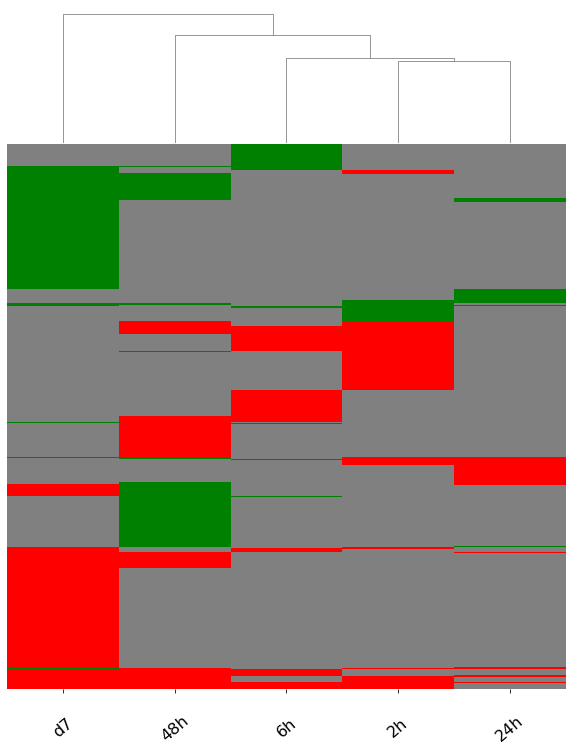

In [28]:
# Create a heatmap with the fold change and significance status for each comparison

all_genes = set(l1+l2+l3+l4+l5)
hmdata = pd.DataFrame(index=all_genes)
degs = [deg1, deg2, deg3, deg4, deg5]
name_degs = ['2h', '24h', '48h', 'd7', '6h']

for i in range(5):

    hmdata[name_degs[i]] = 0
    for gene in degs[i][degs[i]['fc'] > 1]['gene'].tolist():
        hmdata.loc[gene, name_degs[i]] = 1
    for gene in degs[i][degs[i]['fc'] < 1]['gene'].tolist():
        hmdata.loc[gene, name_degs[i]] = -1

sig = np.sum(abs(hmdata), axis = 1)
hmdata = hmdata[sig > 0]
filt = [e == e for e in hmdata.index]
hmdata = hmdata[filt]

cmap = colors.ListedColormap(['green','grey','red'])
plot = sb.clustermap(hmdata, yticklabels=False, vmin = -1, vmax = 1, cmap = cmap, cbar_pos = None)
plot.ax_row_dendrogram.set_visible(False)
plot.ax_row_dendrogram.set_xlim([0,0])
plt.setp(plot.ax_heatmap.xaxis.get_majorticklabels(), rotation=40, va="center", position=(0,-0.06), size = 16)
plot.savefig(save_folder+"/hm_inter_n6vdmso.png")

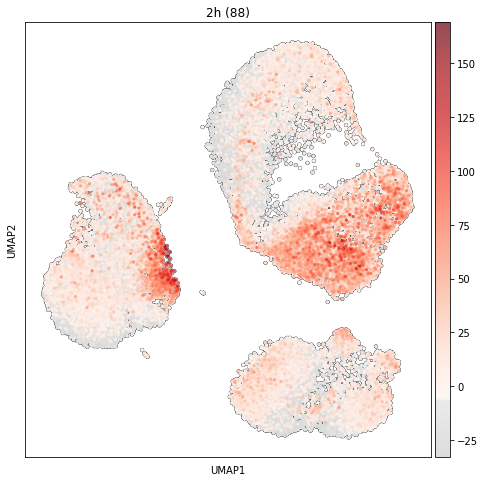

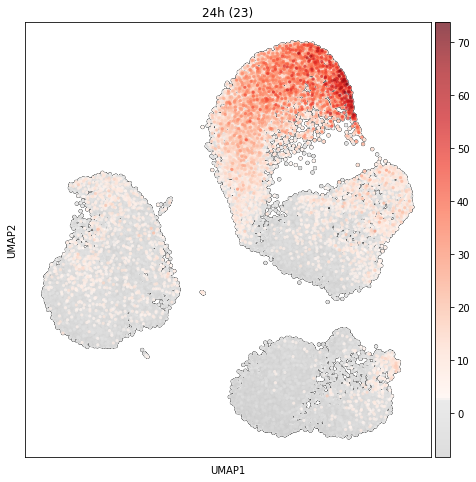

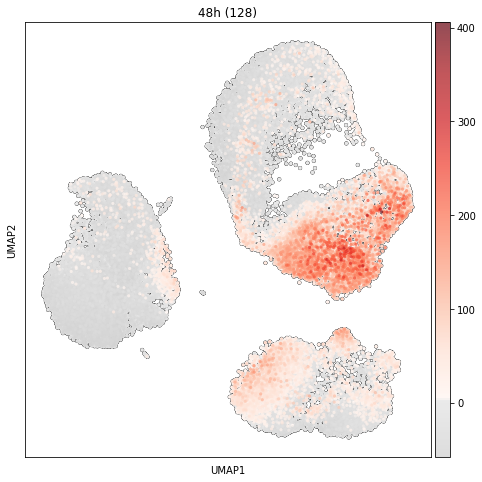

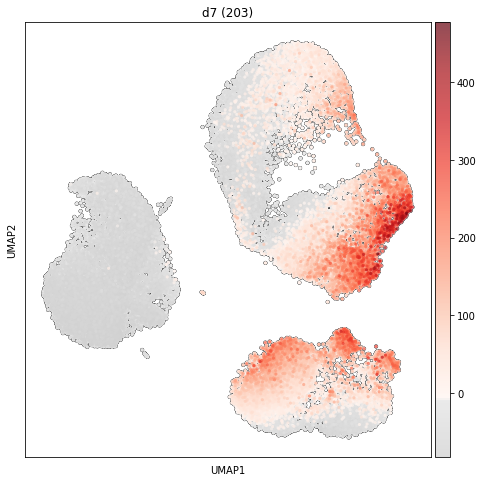

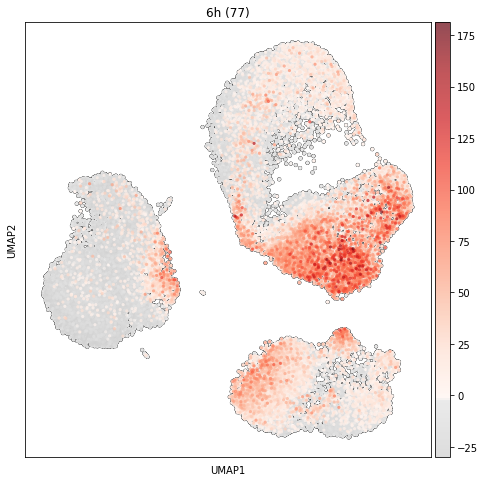

In [29]:
# Represent the average expression at each time point
b = 5
for i in range(5):
    
    BIGLIST = degs[i]
    BIGLIST = BIGLIST[BIGLIST.fc > b].gene.tolist()
    name = name_degs[i]
    av = pd.DataFrame(0, index=adata.obs.index, columns=['mean'])
    for mark in BIGLIST:
        av['mean'] += adata.X[:, adata.var['gene_name'] == mark][:,0]
    adata.obs[name] = av['mean']
    sc.pl.umap(adata, cmap = mymap, color = name, size = 40, add_outline = True, outline_width = [0.1, 0.05],
                ncols = 2, title = name+" ("+str(len(BIGLIST))+")", save = "_mean_hm_"+name+".png")

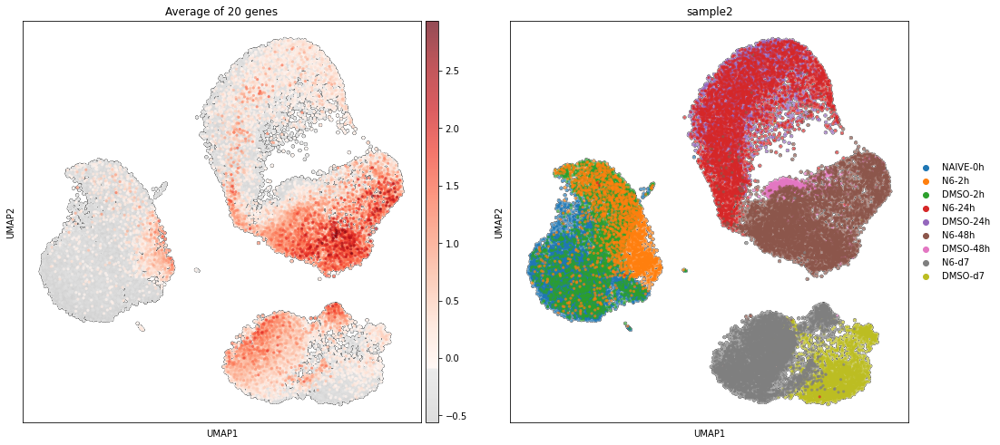

In [30]:
# Compile the list of genes that are significant in at least 4 comparisons

BIGLIST = []
for i in range(len(hmdata)):
    pos = [e for e in hmdata.iloc[i, :] if e > 0]
    neg = [e for e in hmdata.iloc[i, :] if e < 0]
    if ((len(pos) >= 4) and (len(neg) == 0)) or ((len(neg) >= 4) and (len(pos) == 0)):
        BIGLIST.append(hmdata.index[i])

# Save the list to a file

name = "N6vsDMSO_signature"
df = pd.DataFrame(BIGLIST, columns=[name])
df.to_csv('gene_lists/'+name+'.csv', index=False)

# Show their average expression on a UMAP
average_umap(adata, BIGLIST, name)

/tmp/ipykernel_29280/4097713732.py:17: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  data.obs['heatmap'] = newcol


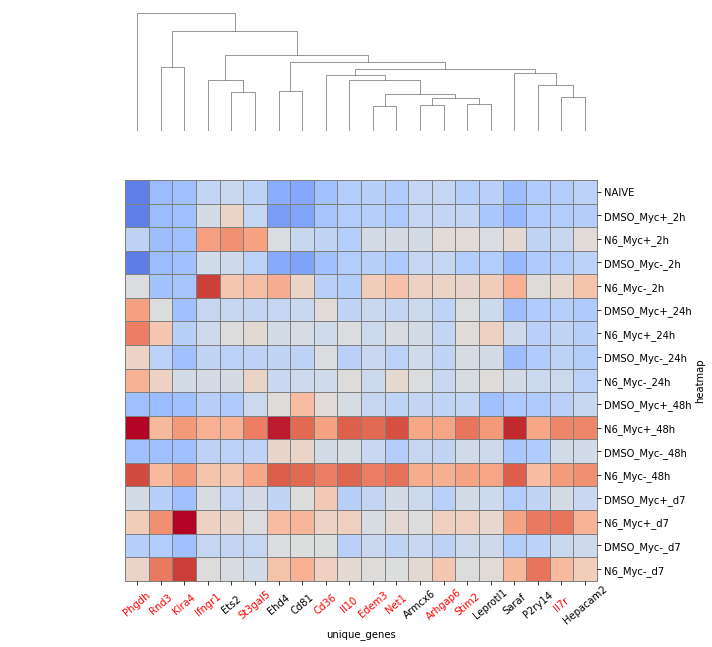

In [31]:
name = "N6vsDMSO_myc"
tkc = ['red', 'red', 'red', 'red', 'black', 
       'red', 'black', 'black', 'red', 'red', 
       'red', 'red', 'black', 'red', 'red', 
       'black', 'black', 'black', 'red', 'black']
myc_n6_hm(adata, BIGLIST, name, tickcolors = tkc)

In [32]:
name = "N6vsDMSO_nomyc"
tkc = ['red', 'red', 'black', 'red', 'red', 
       'red', 'black', 'red', 'red', 'black', 
       'black', 'red', 'black', 'red', 'red', 
       'red', 'red', 'black', 'black', 'black']
nomyc_n6_hm(adata, BIGLIST, name, tickcolors = tkc)

/tmp/ipykernel_29280/1372954577.py:14: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  data.obs['heatmap'] = newcol


# 3. N6 signature at 2 hours

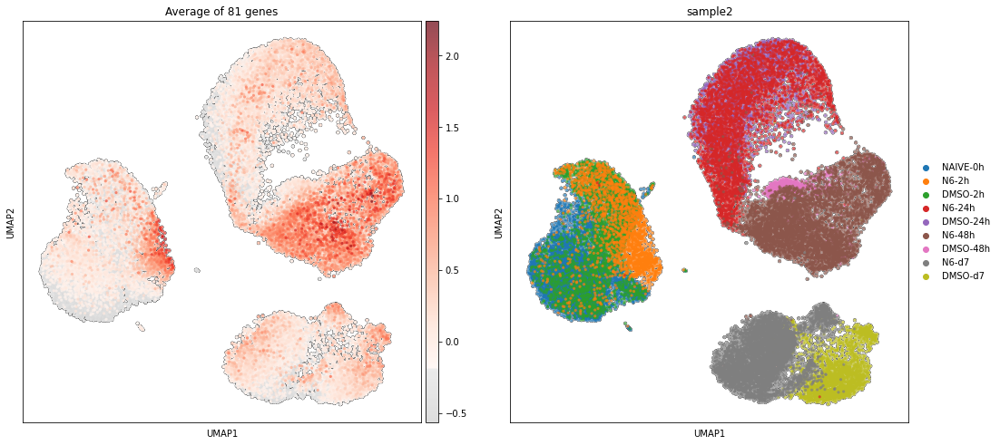

In [ ]:
# Compile the list of genes that are higher in N6-treated cells at 2 hours

BIGLIST = pd.read_excel(save_folder+"deg_final_N6vsDMSO_2h_normalisr.xlsx", sheet_name = "significant")
BIGLIST = BIGLIST[(BIGLIST.fc > 1) & (BIGLIST.qval < 10e-50)].gene.tolist()

# Save the list to a file

name = "N6_2h_qval_10e-50_+"
df = pd.DataFrame(BIGLIST, columns=[name])
df.to_csv('gene_lists/'+name+'.csv', index=False)

# Show their average expression on a UMAP
average_umap(adata, BIGLIST, name)

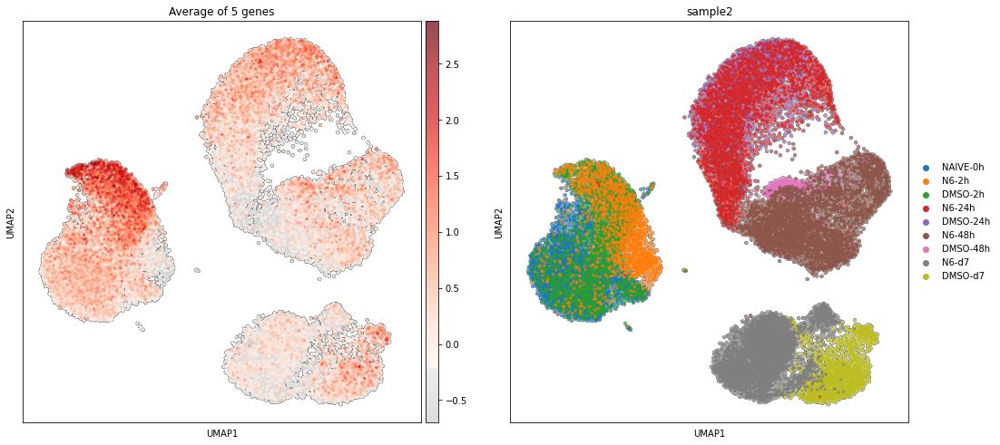

In [ ]:
# Compile the list of genes that are lower in N6-treated cells at 2 hours (FC<0.2)

BIGLIST = pd.read_excel(save_folder+"deg_final_N6vsDMSO_2h_normalisr.xlsx", sheet_name = "significant")
BIGLIST = BIGLIST[(BIGLIST.fc < 1) & (BIGLIST.qval < 10e-50)].gene.tolist()

# Save the list to a file

name = "N6_2h_qval_10e-50_-"
df = pd.DataFrame(BIGLIST, columns=[name])
df.to_csv('gene_lists/'+name+'.csv', index=False)

# Show their average expression on a UMAP
average_umap(adata, BIGLIST, name)

# 4. Il10 signature

In [ ]:
# Extract significant Il10 co-expressed genes

deg1 = pd.read_excel(save_folder+"coex_N6-24h_Il10.xlsx", sheet_name = "significant").gene.tolist()
deg2 = pd.read_excel(save_folder+"coex_N6-48h_Il10.xlsx", sheet_name = "significant").gene.tolist()
deg3 = pd.read_excel(save_folder+"coex_N6-d7_Il10.xlsx", sheet_name = "significant").gene.tolist()

30


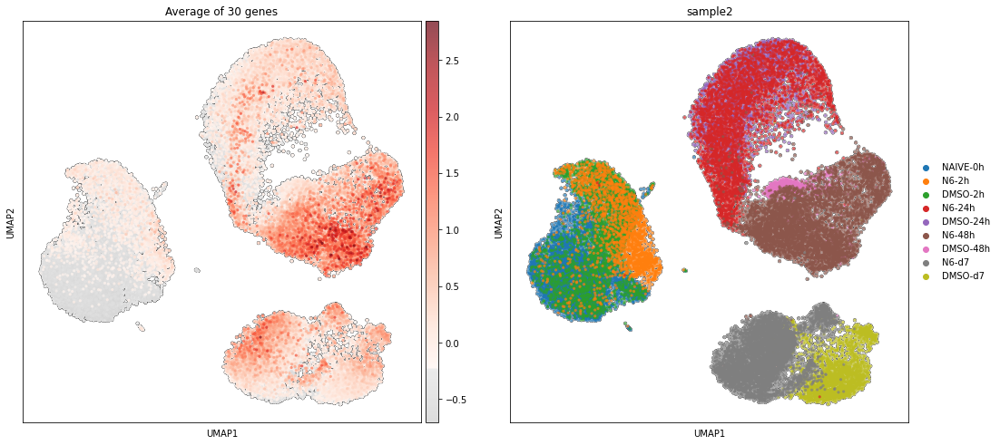

In [ ]:
# Compile the list of genes that are significant in all 3 samples

BIGLIST = [e for e in deg1 if ((e in deg2) and (e in deg3))]
print(len(BIGLIST))

# Save the list to a file

name = "Il10_signature"
df = pd.DataFrame(BIGLIST, columns=[name])
df.to_csv('gene_lists/'+name+'.csv', index=False)

# Show their average expression on a UMAP
average_umap(adata, BIGLIST, name)

# 5. Crossing Il10 and N6 signatures

In [ ]:
# Cross the signatures

df = pd.read_csv('gene_lists/'+"Il10_signature"+'.csv')
il10 = set(df[df.columns[0]].tolist())
df = pd.read_csv('gene_lists/'+"N6vsDMSO_signature"+'.csv')
n6 = set(df[df.columns[0]].tolist())

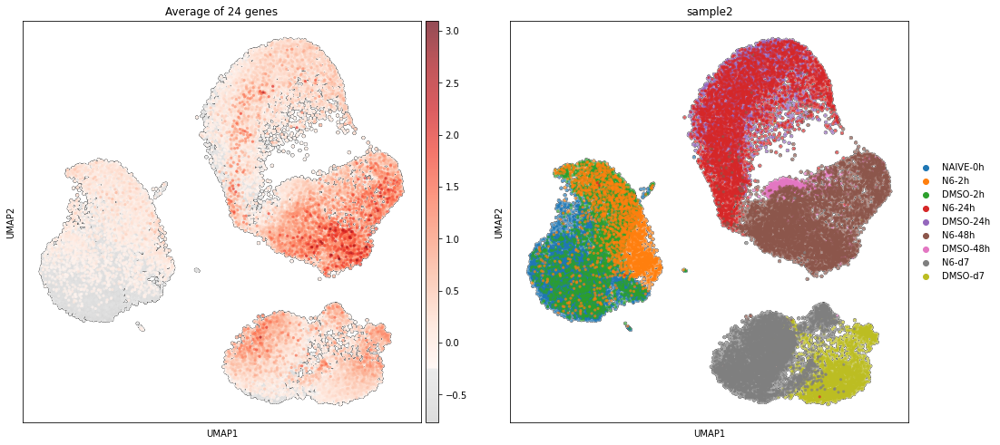

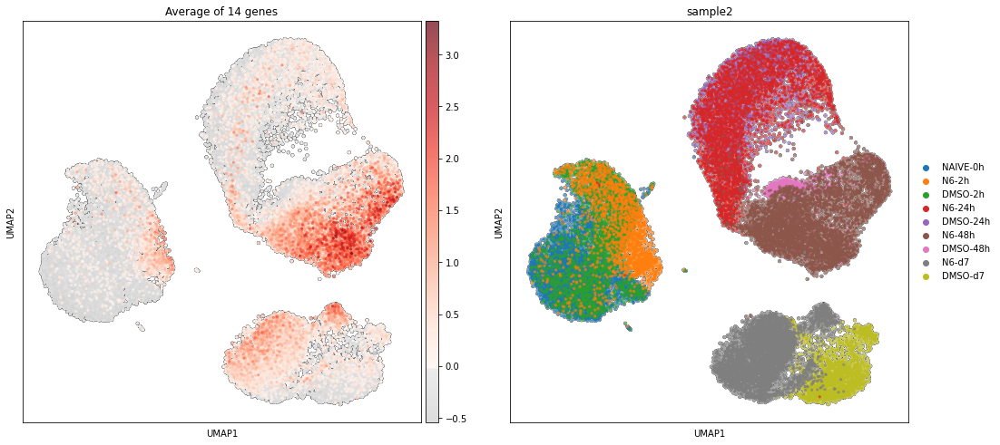

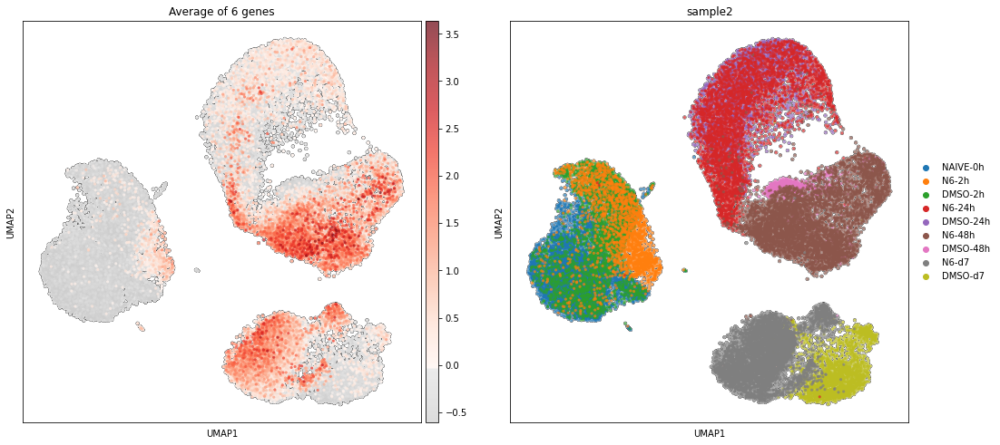

In [ ]:
# Show the average expression of il10 - n6 on a UMAP
average_umap(adata, list(il10 - n6), "il10_exclusive")

# Show the average expression of n6 - il10 on a UMAP
average_umap(adata, list(n6 - il10), "n6_exclusive")

# Show the average expression of il10 & n6 on a UMAP
average_umap(adata, list(il10 & n6), "intersection_il10_n6")

# 6. Functional enrichment

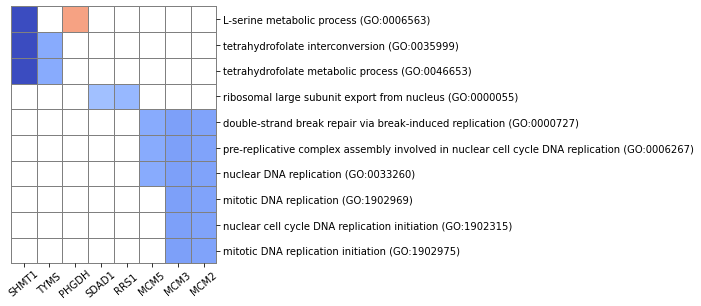

In [ ]:
run_func_enr("deg_final_IL10PosvsNeg_N6-24h_normalisr.xlsx", name="IL10PosvsNeg_N6-24h", voff=0.05)

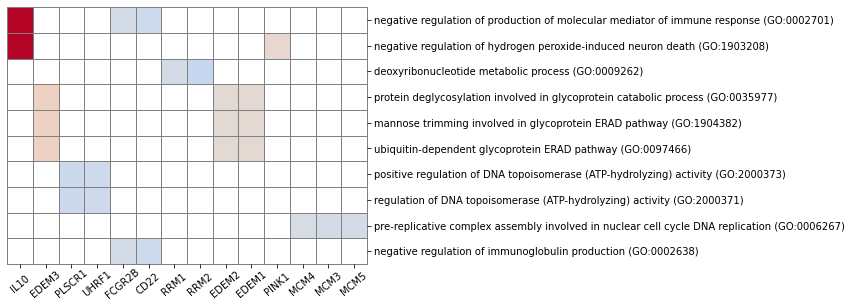

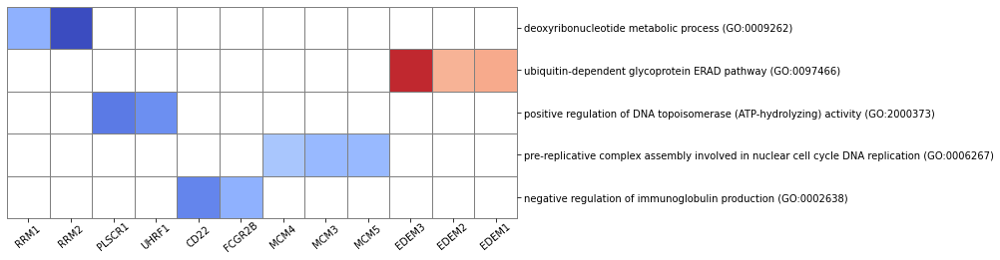

In [ ]:
run_func_enr("deg_final_IL10PosvsNeg_N6-48h_normalisr.xlsx", name="IL10PosvsNeg_N6-48h", voff=0.05)
run_func_enr("deg_final_IL10PosvsNeg_N6-48h_normalisr.xlsx", name="IL10PosvsNeg_N6-48h_no_il10", sublist=[1,3,5,7,9], voff=0.05)

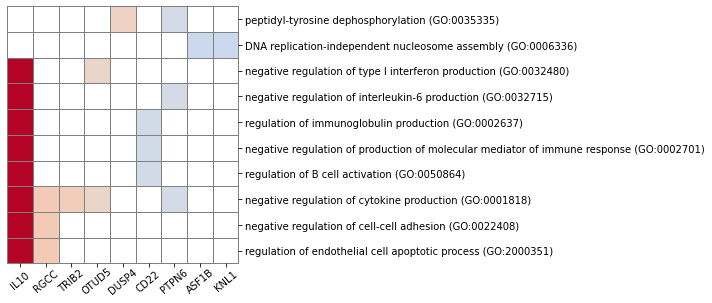

In [ ]:
run_func_enr("deg_final_IL10HighvsLow_N6-48h_normalisr.xlsx", name="IL10HighvsLow_N6-48h", voff=0.04)

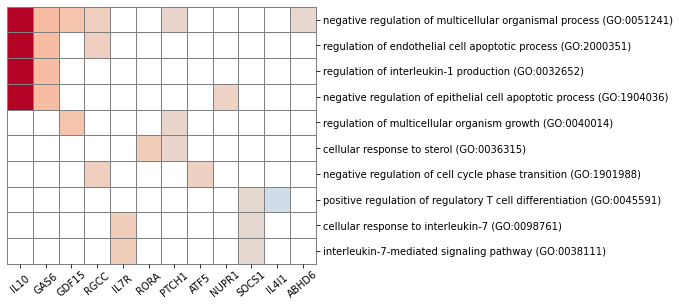

In [ ]:
run_func_enr("deg_final_IL10PosvsNeg_N6-d7_normalisr.xlsx", name="IL10PosvsNeg_N6-d7", voff=0.05)

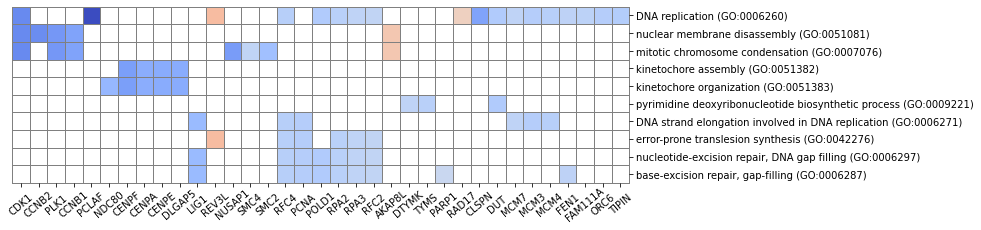

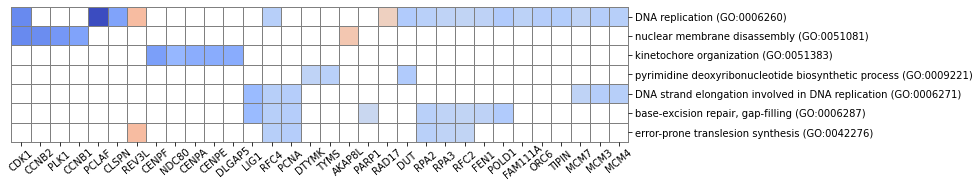

In [ ]:
run_func_enr("deg_final_N6vsDMSO_48h_normalisr.xlsx", name="N6vsDMSO_48h", voff=0.08)
run_func_enr("deg_final_N6vsDMSO_48h_normalisr.xlsx", name="N6vsDMSO_48h_norep", sublist=[0,2,3,4,6,7,8], voff=0.09)

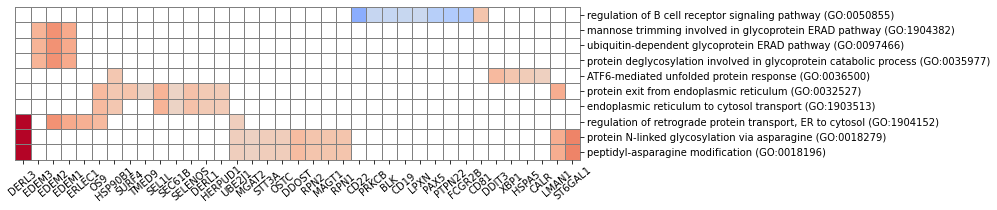

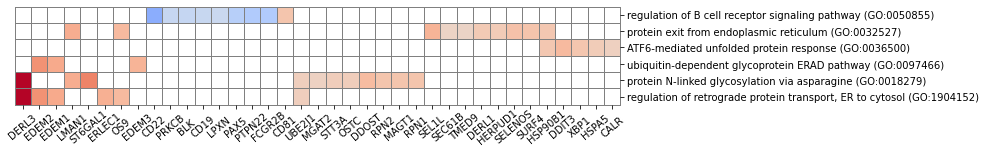

In [ ]:
run_func_enr("deg_final_N6vsDMSO_d7_normalisr.xlsx", name="N6vsDMSO_d7", voff=0.11)
run_func_enr("deg_final_N6vsDMSO_d7_normalisr.xlsx", name="N6vsDMSO_d7_norep", sublist=[0,1,3,4,7,8], voff=0.15)

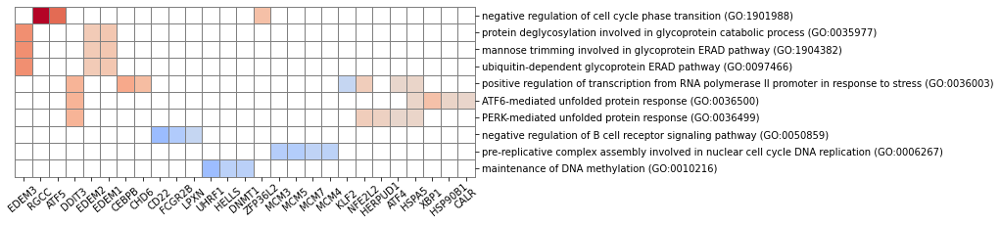

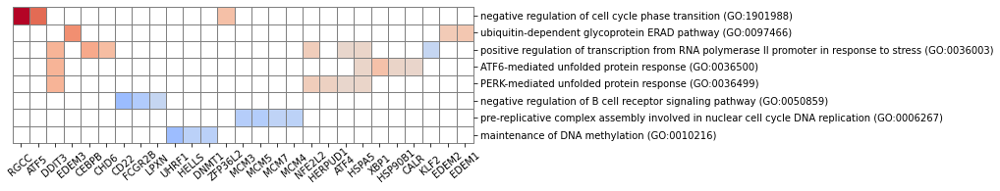

In [ ]:
run_func_enr("coex_N6-48h_Il10.xlsx", name="coex_N6-48h_Il10", voff=0.09)
run_func_enr("coex_N6-48h_Il10.xlsx", name="coex_N6-48h_Il10_norep", sublist=[0,2,4,5,6,7,8,9], voff=0.11)

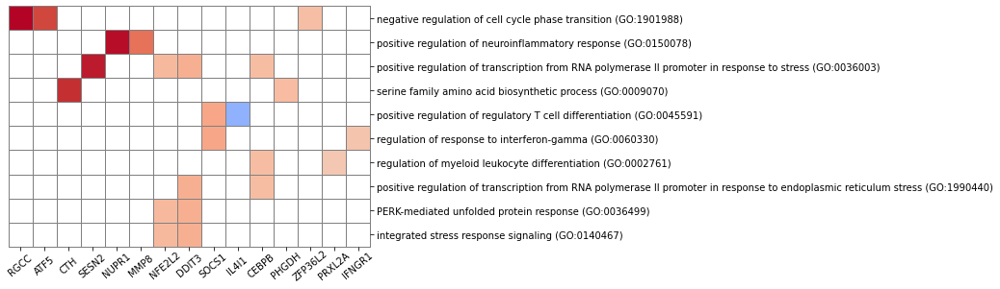

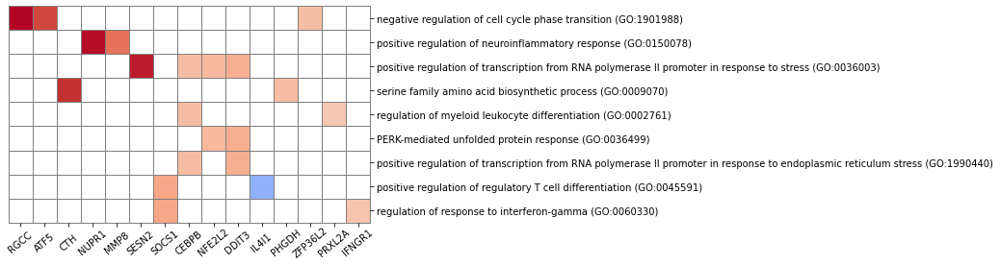

In [ ]:
run_func_enr("coex_N6-d7_Il10.xlsx", name="coex_N6-d7_Il10", voff=0.05)
run_func_enr("coex_N6-d7_Il10.xlsx", name="coex_N6-d7_Il10_norep", sublist=[0,1,2,3,4,5,6,7,8], voff=0.06)

# 7. Dot plot of Il10 regulators in T cells

In [ ]:
# add column
newcol = []
for i in range(len(adata.obs)):
    line = adata.obs.iloc[i, :]
    if line['tp']=='0h' : add='0h'
    else:
        add = line['cond'] + "_" + line['tp'] + "_" + line['Il10_positive']
    newcol.append(add)
adata.obs['heatmap'] = newcol

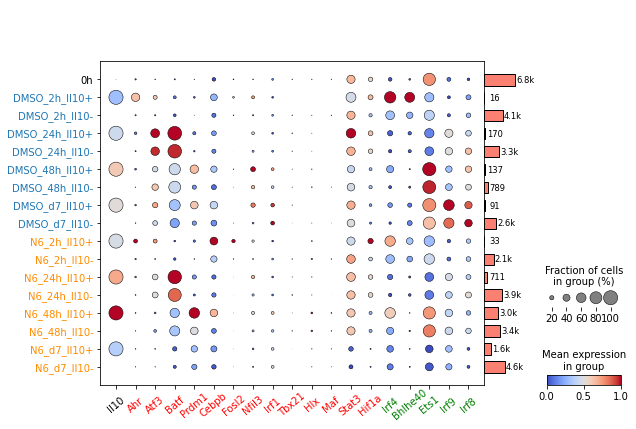

In [ ]:
font = {'size' : 12}
plt.rc('font', **font)

markers = ['Il10'] + ["Ahr", "Atf3", "Batf", "Prdm1", "Cebpb", "Fosl2", "Nfil3", "Irf1", "Tbx21", "Hlx", "Maf", "Stat3", "Hif1a", 
                      "Irf4", "Bhlhe40", "Ets1", "Irf9", "Irf8"]
dp = sc.pl.dotplot(adata, markers, groupby="heatmap", return_fig = True,
                  swap_axes = False, standard_scale = 'var')

dp = dp.add_totals().style(dot_edge_color='black', dot_edge_lw=0.5, cmap = "coolwarm")
ax = dp.get_axes()['mainplot_ax']
ax.set_xticklabels(markers, rotation = 40, va="center", position=(0,-0.04))

for ticklabel, tickcolor in zip(ax.get_xticklabels(), ['black']+['red']*13+['green']*15):
    ticklabel.set_color(tickcolor)
for ticklabel, tickcolor in zip(ax.get_yticklabels(), ['black']+['tab:blue']*8+['darkorange']*8):
    ticklabel.set_color(tickcolor)

plt.savefig(save_folder+"biblio_il10_dotplot_all.pdf", bbox_inches='tight', dpi = 1000)

font = {'size' : 10}
plt.rc('font', **font)

# 8. UMAPs

In [ ]:
# Load the pre-processed data
with open('saved_objects/adata_annotated.pkl', 'rb') as inp:
    adata = pickle.load(inp)

adata.X = adata.raw.X
sc.pp.log1p(adata)

In [ ]:
#Define a nice colour map for gene expression
colors2 = plt.cm.Reds(np.linspace(0, 1, 90))
colors3 = plt.cm.Greys_r(np.linspace(0.7,0.8,10))
colorsComb = np.vstack([colors3, colors2])
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

plt.rcParams['figure.figsize']=(8,8) #rescale figures
plt.rcParams.update({'axes.titlesize' : 30})

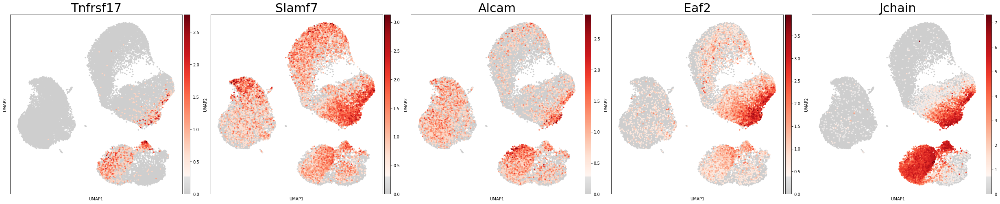

In [ ]:
markers = ['Tnfrsf17', 'Slamf7', 'Alcam', 'Eaf2', 'Jchain']
sc.pl.umap(adata, cmap=mymap, color = markers, size = 50, wspace = 0.06, hspace = 0.12, ncols = 5, save="_PC_biblio.pdf")

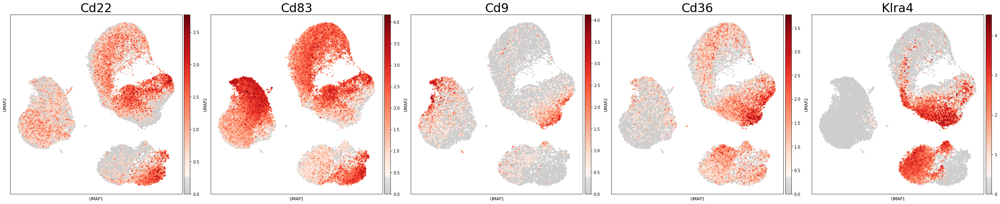

In [ ]:
markers = ['Cd22', 'Cd83', 'Cd9', 'Cd36', 'Klra4']
sc.pl.umap(adata, cmap=mymap, color = markers, size = 50, wspace = 0.06, hspace = 0.12, ncols = 5, save="_surface.png")

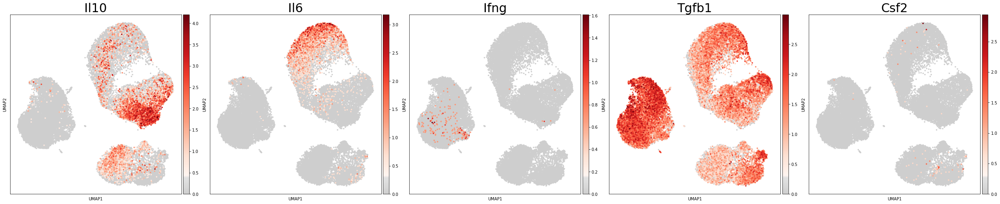

In [ ]:
markers = ['Il10', 'Il6', 'Ifng', 'Tgfb1', 'Csf2']
sc.pl.umap(adata, cmap=mymap, color = markers, size = 50, wspace = 0.06, hspace = 0.12, ncols = 5, save="_cytokines.pdf")

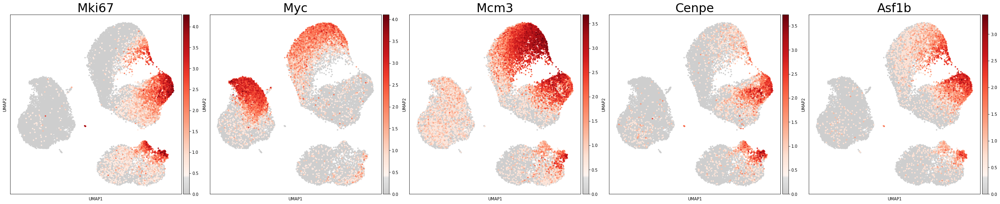

In [ ]:
markers = ['Mki67', 'Myc', 'Mcm3', 'Cenpe', 'Asf1b']
sc.pl.umap(adata, cmap=mymap, color = markers, size = 50, wspace = 0.06, hspace = 0.12, ncols = 5, save="_cycle.pdf")

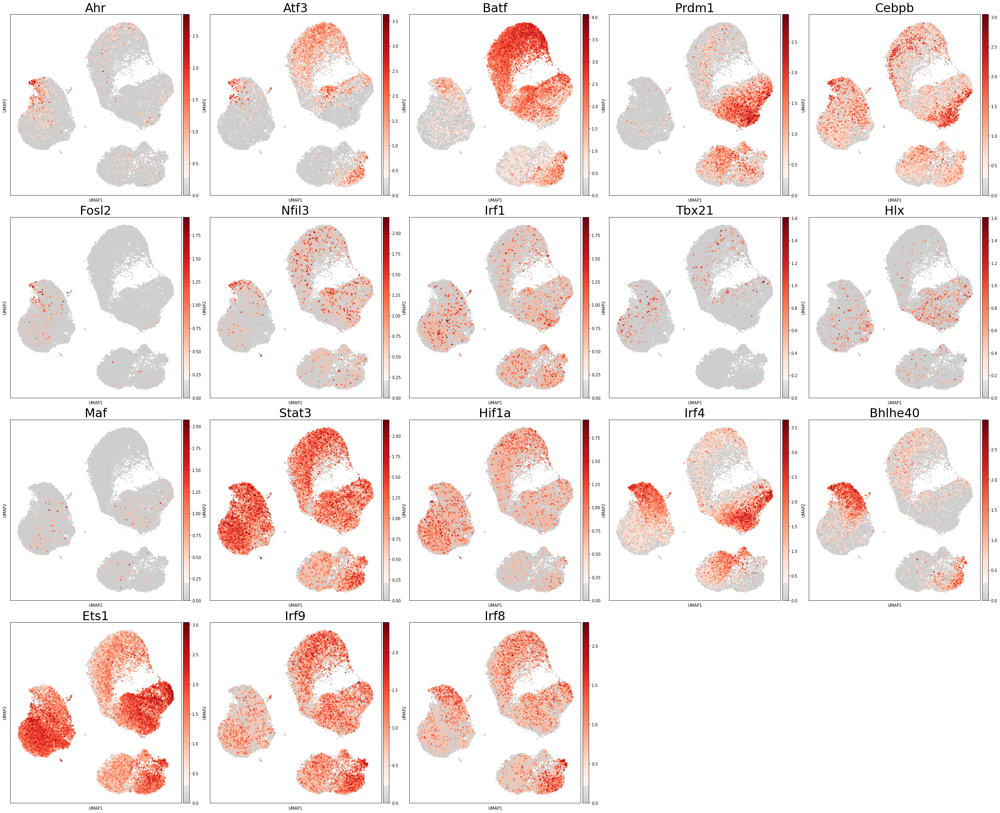

In [ ]:
markers = ["Ahr", "Atf3", "Batf", "Prdm1", "Cebpb", "Fosl2", "Nfil3", "Irf1", "Tbx21", "Hlx", "Maf", "Stat3", "Hif1a", 
                      "Irf4", "Bhlhe40", "Ets1", "Irf9", "Irf8"]
sc.pl.umap(adata, cmap=mymap, color = markers, size = 50, wspace = 0.06, hspace = 0.12, ncols = 5, save="_il10_t_cell.pdf")

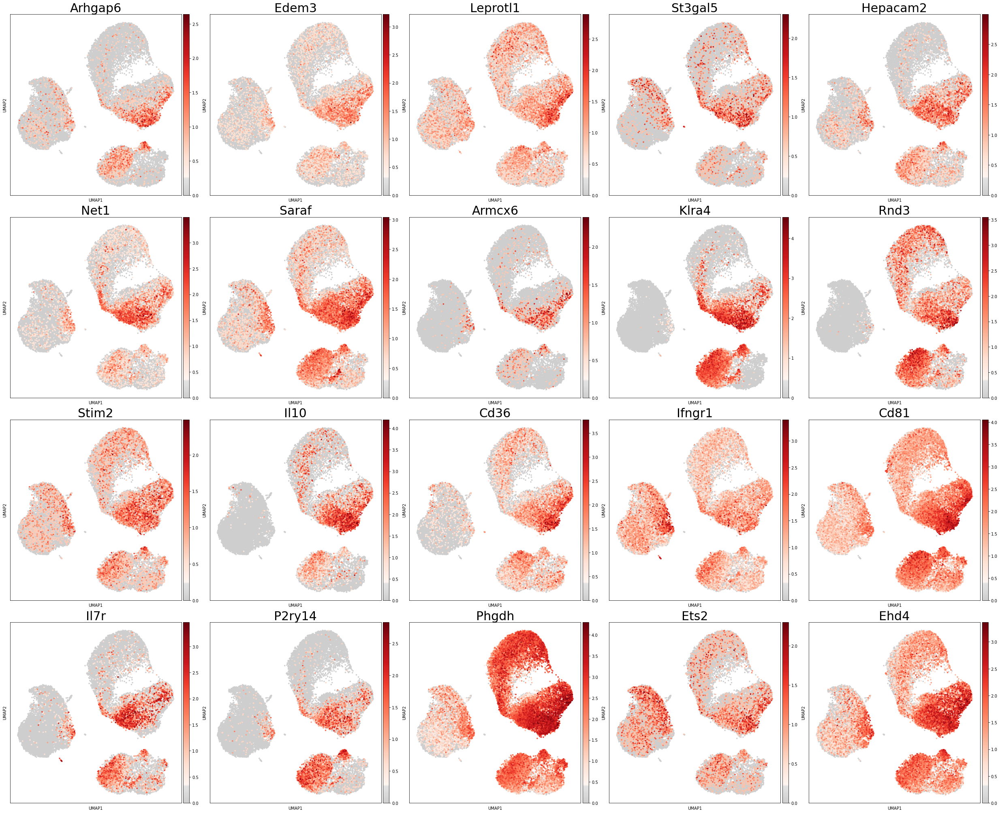

In [ ]:
df = pd.read_csv('gene_lists/'+"N6vsDMSO_signature"+'.csv')
markers = df[df.columns[0]].tolist()
sc.pl.umap(adata, cmap=mymap, color = markers, size = 50, wspace = 0.06, hspace = 0.12, ncols = 5, save="_n6_sig.pdf")

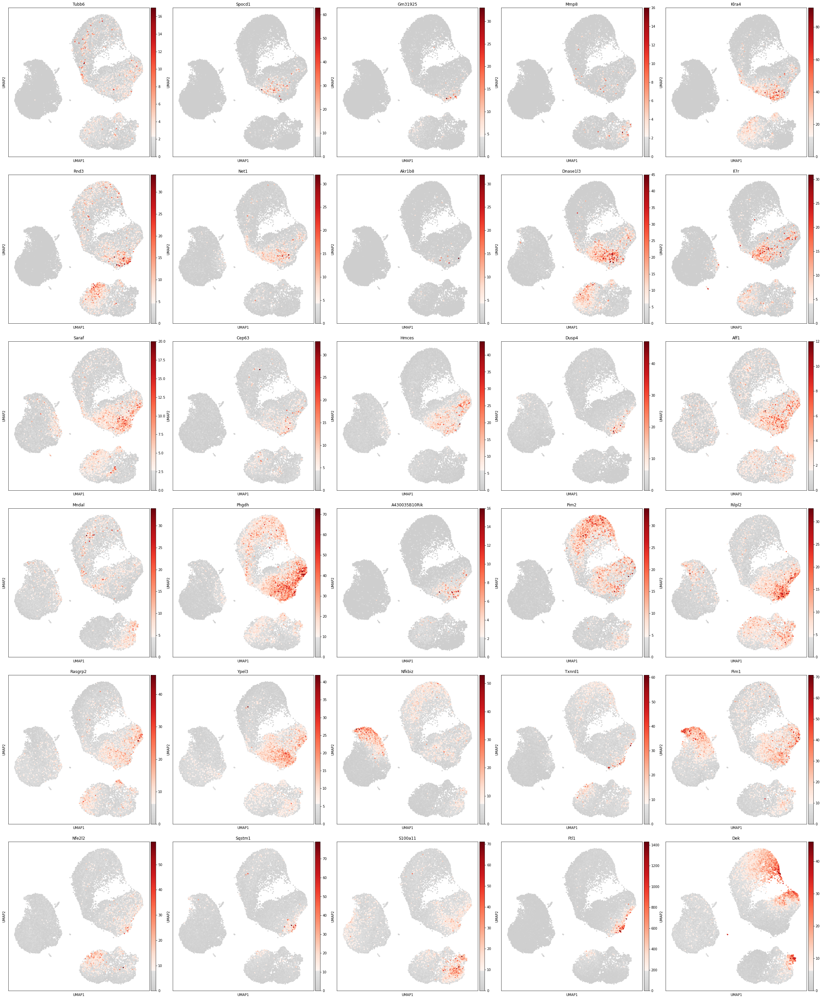

In [ ]:
df = pd.read_csv('gene_lists/'+"Il10_signature"+'.csv')
markers = df[df.columns[0]].tolist()
sc.pl.umap(adata, cmap=mymap, color = markers, size = 50, wspace = 0.06, hspace = 0.12, ncols = 5, save="_il10_sig.pdf")